# (ii) Modelo com três planetas circumbinários

Neste modelo de ajuste do ($O-C$) de Kepler-451, a fim de investigar as possíveis causas de sua VPO, usamos o método *MCMC* adaptado para o *Stretch Move* para ajustar os valores dos parâmetros livres da seguinte equação:

$$T_{min} = T_0 + EP + \sum_{1}^{N}\tau_j ,$$

sendo $T_{min}$ os instantes dos eclipses ajustados para uma efeméride linear do período orbital da binária, $P$, mais uma efeméride do ETL originado pela influência de um j-ésimo PCB sobre o sistema. O centro de massa da binária, $CM_2$, passa a orbitar em torno do centro de massa comum, que consiste na binária interna e no j-ésimo
planeta, $CM_j$.

Antes de tudo, importando as bibliotecas necessárias para esse ajuste, binando os dados para as barras de erro e definindo algumas constantes relevantes para essa metodologia:

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import smplotlib
from astropy import table
from astropy.io import ascii
from numba import jit
from scipy import optimize
from IPython.display import display, Math
import emcee
import corner

In [2]:
def adaptative_bin(x, y, yerr, oc, nbins):
    
    bins = np.array_split(x, nbins)

    xbin    = np.array([np.median(bin) for bin in bins])
    ybin    = np.array([np.median(y[np.in1d(x, bin)]) for bin in bins])
    yerrbin = np.array([np.std(yerr[np.in1d(x, bin)]) for bin in bins])
    ocbin   = np.array([np.median(oc[np.in1d(x, bin)]) for bin in bins])

    return xbin, ybin, yerrbin, ocbin

In [29]:
# According https://aas.org/posts/story/2013/08/report-2012-iau-xxviii-general-assembly
c = 299792458             # [m/s]
UA = 149597870700         # [m]

# According https://www.iau.org/static/resolutions/IAU2015_English.pdf 
G = 6.67408*10**(-11)     # 2014 CODATA 6.67408 (± 0.00031) × 10^(−11) m^3/(kg s^2)
G_gauss = (2*np.pi)**2    # [year, AU, M_Sun] 
M_Sun = 1.9891*10**(30)   # [kg]
M_Jup = 1.89813*10**(27)  # [kg]

# Binary's masses according to Østensen et al. (2010):
M_1 = 0.48                # [M_Sun]
erro_M1 = 0.03
M_2 = 0.12                # [M_Sun]
erro_M2 = 0.01
i = 69.45                 # [degrees]
erro_i = 0.20

Agora vamos importar os dados fotométricos coletados desse sistema entre os anos de 2008 a 2024. O arquivo `2008_2024.txt` possui os ciclos, instantes dos eclipses em *BJD*-2450000 e os erros dos instantes ajustados pelo modelo WD+PIKAIA.

Esse arquivo contém observações de 2008 realizadas pelo Prof. Dr. Leonardo Andrade de Almeida, os dados obtidos pela missão *Kepler* de 2009 a 2013 com uma cadência de 60 s (Q0,5–17) e os dados obtidos pelo *TESS* de 2019 a 2024 dos setores 14 e 15 com cadência de 120 s e os setores 40, 54, 74 e 75 com cadência de 20 s.

Os instantes dos eclipses em *BKJD* e *BTJD*, baixados pela função [`search_lightcurve()`](https://iopscience.iop.org/article/10.3847/1538-3881/aafc33/meta) da biblioteca [`lightkurve`](https://ui.adsabs.harvard.edu/abs/2018ascl.soft12013L/abstract) do `python` e ajustados por nós pelo método WD+PIKAIA, foram convertidos para *BJD*-2450000 através de uma ferramenta `cl` do *IRAF*, obedecendo a sequinte relação:

$\begin{cases}
    BJD = BKJD + 2454833\\
    BJD = BTJD + 2457000
\end{cases}$

In [4]:
data = ascii.read('2008_2024.dat')

x    = data['cycle']
y    = data['time']
yerr = data['time_err']

data[:5]

cycle,time,time_err
float64,float64,float64
-2486.0,4640.8642,4e-05
-1891.0,4715.6944,4e-05
-1772.0,4730.6606,4e-05
-1557.0,4757.7001,4e-05
2.0,4953.768147,9e-06


Em nosso modelo de análise da VPO de Kepler-451, usamos a equação das efemérides linear, referente aos instantes dos eclipses calculados pelo modelo WD+PIKAIA, mais do ETL a cima para ajustar três sinais senoidais no ($O-C$). Os $\tau_3$, $\tau_4$ e $\tau_5$, ocasionados pelos terceiro, quarto e quinto corpos do sistema (PCBs), são determinados como:

$$\tau_j = \frac{a_j\sin i_j}{c}\left[\frac{1-e^2_j}{1+e_j\cos\nu_j}\sin\left(\nu_j + \overline{\omega}_j\right)+e_j\sin\overline{\omega}_j\right] ,$$

onde a anomalia verdadeira, $\nu_j$, é derivada pelas seguintes relações:

1.  $\tan\left(\frac{\nu_j}{2}\right) = \sqrt{\frac{1+e_j}{1-e_j}}\tan\left(\frac{\epsilon_j}{2}\right)$

2.  $\epsilon_j - e_j\sin\epsilon_j = \mathcal{M_j}$ (eq. transcendente da anomalia excêntrica)

3.  $\epsilon_j \sim \mathcal{M_j} + \left(e_j - \frac{3}{24}e^2_j\right)\sin(\mathcal{M_j}) + \left(\frac{e^2_j}{2}-\frac{e^4_j}{8}\right)\sin(2\mathcal{M_j}) \ldots$ (solução da eq. transcendente)

4.  $\mathcal{M_j} = \frac{2\pi}{P'_j}(T_0 + EP - T'_j)$ (anomalia média)

Usamos como parâmetros de entrada para a função `optimize.curve_fit()` da biblioteca [`scipy`](https://zenodo.org/records/6940349), função que nos fornece os valores iniciais dos parâmetros para o *MCMC Stretch Move*, o período orbital e a inclinação¹ da binária encontrados por [Baran et al.](https://www.aanda.org/articles/aa/abs/2015/05/aa25392-14/aa25392-14.html) e aproximadamente 400, 1800 e 4000 dias para os períodos orbitais do primeiro, segundo e terceiro planetas, respectivamente. 

¹Assumimos que os PCBs são aproximadamente coplanares à binária.

In [8]:
@jit(nopython=True)
def model_3bodys (x, P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4, P5, T5, e5, asini5, o5):
    
    n_points = len(x)

    efli = np.zeros(n_points)     
    tau3 = np.zeros(n_points)
    tau4 = np.zeros(n_points)
    tau5 = np.zeros(n_points)

    r3   = 360./P3                   # movimento angular médio do terceiro corpo do sistema
    r4   = 360./P4                   # movimento angular médio do quarto corpo do sistema
    r5   = 360./P5                   # movimento angular médio do quinto corpo do sistema

    for idx in range(n_points):
        n = x[idx]
        
        # Efeméride linear
        el = T0 + P*n
        efli[idx] = el
        
        # Primeiro corpo externo
        M  = ((T0 + P*n) - T3)*r3    # anomalia média do terceiro corpo
        M1 = M -(360*int(M/360.))    # M[0°,360°]
        M2 = M1 * np.pi / 180.
        eps = M2 + e3*np.sin(M2)     # solução da eq. transcendente da anomalia excêntrica com excentricidade até 1° ordem
        eps1 = eps + (M2 - (eps - e3*np.sin(eps)))/(1.0 - e3*np.cos(eps))
        for i in range(10):
            eps1 = eps1 + (M2 - (eps1 - e3*np.sin(eps1)))/(1.0 - e3*np.cos(eps1))
        q  = np.sqrt((1.0 + e3) / (1.0 - e3)) * np.tan(eps1 / 2.0)
        v  = 2. * np.arctan(q)       # anomalia verdadeira
        aux1  = asini3*UA / (c*24*3600)
        aux2  = ((1. - e3**2) / (1 + e3*np.cos(v))) * np.sin(v + ((o3%360)*np.pi/180.))
        aux3  = e3*np.sin((o3%360)*np.pi/180.)
        mody  = aux1 * (aux2 + aux3)
        tau3[idx] = mody
        
        # Segundo corpo externo
        M  = ((T0 + P*n) - T4)*r4    # anomalia média do quarto corpo
        M1 = M -(360*int(M/360.))    
        M2 = M1 * np.pi / 180.
        eps = M2 + e4*np.sin(M2)     
        eps1 = eps + (M2 - (eps - e4*np.sin(eps)))/(1.0 - e4*np.cos(eps))
        for i in range(10):
            eps1 = eps1 + (M2 - (eps1 - e4*np.sin(eps1)))/(1.0 - e4*np.cos(eps1))
        q  = np.sqrt((1.0 + e4) / (1.0 - e4)) * np.tan(eps1 / 2.0)
        v  = 2. * np.arctan(q)       
        aux1  = asini4*UA / (c*24*3600)
        aux2  = ((1. - e4**2) / (1 + e4*np.cos(v))) * np.sin(v + ((o4%360)*np.pi/180.))
        aux3  = e4*np.sin((o4%360)*np.pi/180.)
        mody  = aux1 * (aux2 + aux3)
        tau4[idx] = mody
        
        # Terceiro corpo externo
        M  = ((T0 + P*n) - T5)*r5    # anomalia média do quinto corpo
        M1 = M -(360*int(M/360.))    
        M2 = M1 * np.pi / 180.
        eps = M2 + e5*np.sin(M2)  
        eps1 = eps + (M2 - (eps - e5*np.sin(eps)))/(1.0 - e5*np.cos(eps))
        for i in range(10):
            eps1 = eps1 + (M2 - (eps1 - e5*np.sin(eps1)))/(1.0 - e5*np.cos(eps1))
        q  = np.sqrt((1.0 + e5) / (1.0 - e5)) * np.tan(eps1 / 2.0)
        v  = 2. * np.arctan(q)       
        aux1  = asini5*UA / (c*24*3600)
        aux2  = ((1. - e5**2) / (1 + e5*np.cos(v))) * np.sin(v + ((o5%360)*np.pi/180.))
        aux3  = e5*np.sin((o5%360)*np.pi/180.)
        mody  = aux1 * (aux2 + aux3)
        tau5[idx] = mody

    Tmin = efli + tau3 + tau4 + tau5
    return Tmin

p0 = [0.125765282, 4953.516,
      404, 1243, 0.16, 1.805*np.sin(179.92*np.pi/180), 140,
      4*404, 1243, 0.36, 1.40*np.sin(60*np.pi/180), 200,
      5000, 1243, 0.36, 5.8940*np.sin(180.400*np.pi/180), 140]

bounds = [(0.1250, 4900,
           300, 1000, 0.0, 0., 0, 0,
           1000, 1000, 0.0, 0. , 0., 0.,
           5000, 1000, 0.0, 0. , 0., 0.),
          (0.1260, 5000,
           np.inf, 2000, 0.99, 10., 360, 360,
           np.inf, 2000, 0.99, 10., 360, 360,
           np.inf, 2000, 0.99, 10., 360, 360)]

params3_, cov3_ = optimize.curve_fit(model_3bodys, x, y, sigma=yerr, p0 = p0, maxfev=5000)
params3_

array([ 1.25765288e-01,  4.95351676e+03,  4.22981006e+02,  1.12300287e+03,
        1.55765565e-01,  2.32347427e-03,  1.45695095e+02,  1.77030274e+03,
        1.04936824e+03,  3.44730173e-01,  1.32820767e-02,  2.31800466e+02,
        4.66234294e+03,  1.36226587e+03,  4.16106770e-01, -4.01451371e-02,
        1.17267273e+02])

Usamos o Teorema de Bayes,

$$\mathbb{P}(\boldsymbol{\theta}|\mathbf{D}) = \frac{\mathbb{P}(\mathbf{D}|\boldsymbol{\theta})\mathbb{P}(\boldsymbol{\theta})}{\mathbb{P}(\mathbf{D})}$$ \\
$$ln\mathbb{P}(\boldsymbol{\theta}|\mathbf{D}) = ln\mathbb{P}(\mathbf{D}|\boldsymbol{\theta}) + ln\mathbb{P}(\boldsymbol{\theta}) - ln\mathbb{P}(\mathbf{D}) ,$$

para definir a distribuição a posteriori dos parâmetros $\theta$ do modelo com $D$ dados, $\mathbb{P}(\boldsymbol{\theta}|\mathbf{D})$. Na prática, $ln\mathbb{P}(\mathbf{D})$ não afeta o processo de optimização dos parâmetros, logo podemos simplificar a posteriori como sendo proporcional à verossimilhança, $\mathbb{P}(\mathbf{D}|\boldsymbol{\theta})$, e à distribuição a priori, $\mathbb{P}(\boldsymbol{\theta})$:

$$ln\mathbb{P}(\boldsymbol{\theta}|\mathbf{D}) \propto ln\mathbb{P}(\mathbf{D}|\boldsymbol{\theta}) + ln\mathbb{P}(\boldsymbol{\theta})$$

E o logaritmo da verossimilhança na forma:

$$ln\mathbb{P}(\mathbf{D}|\boldsymbol{\theta}) = -\frac{1}{2}\sum_{1}^{N}\left(\frac{(O_j - C_j)^2}{\sigma^2_j} + ln(2\pi\sigma^2_j)\right)$$

In [9]:
@jit(nopython=True)
def lnlike_model3(theta, x, y, yerr):
    P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4, P5, T5, e5, asini5, o5 = theta
    model = model_3bodys(x, P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4, P5, T5, e5, asini5, o5)
    chi2 = np.sum(((y - model)/yerr)**2 + np.log(2*np.pi*yerr**2))
    if np.isnan(chi2) or np.isinf(chi2):
        return -np.inf
    return -0.5 * chi2    


@jit(nopython=True)
def lnprior_model3(theta):
    P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4, P5, T5, e5, asini5, o5 = theta
    if (0.1257 < P < 0.1258 and 4953.51 < T0 < 4953.52 and
        300 < P3 < 500 and 1000 < T3 < 2000 and 0.0 <= e3 < 0.5 and -10 < asini3 < 10 and 0 < o3 < 360 and
        1000 < P4 < 2000 and 1000 < T4 < 2000 and 0.0 <= e4 < 0.99 and -10 < asini4 < 10 and 0 < o4 < 360 and
        4000 < P5 < 7000 and 1000 < T5 < 2000 and 0.0 <= e5 < 0.99 and -10 < asini5 < 10 and 0 < o5 < 360):
        return 0.0
    return -np.inf


@jit(nopython=True)
def lnpos_model3(theta, x, y, yerr):
    lnprior = lnprior_model3(theta)
    if not np.isfinite(lnprior):
        return -np.inf
    return lnprior + lnlike_model3(theta, x, y, yerr)

Definindo os parâmetros iniciais para o *MCMC* como os obtidos pelo `optimize`:

In [10]:
params3_

array([ 1.25765288e-01,  4.95351676e+03,  4.22981006e+02,  1.12300287e+03,
        1.55765565e-01,  2.32347427e-03,  1.45695095e+02,  1.77030274e+03,
        1.04936824e+03,  3.44730173e-01,  1.32820767e-02,  2.31800466e+02,
        4.66234294e+03,  1.36226587e+03,  4.16106770e-01, -4.01451371e-02,
        1.17267273e+02])

In [11]:
Pi      = 1.25765288e-01
T0i     = 4.95351676e+03
P3i     = 4.22981006e+02
T3i     = 1.12300287e+03
e3i     = 1.55765565e-01
asini3i = 2.32347427e-03
o3i     = 1.45695095e+02
P4i     = 1.77030274e+03
T4i     = 1.04936824e+03
e4i     = 3.44730173e-01
asini4i = 1.32820767e-02
o4i     = 2.31800466e+02
P5i     = 4.66234294e+03
T5i     = 1.36226587e+03
e5i     = 4.16106770e-01
asini5i = -4.01451371e-02
o5i     = 1.17267273e+02

initial = np.array([])
initial = Pi, T0i, P3i, T3i, e3i, asini3i, o3i, P4i, T4i, e4i, asini4i, o4i, P5i, T5i, e5i, asini5i, o5i

Definindo o número de *walkers*, responsáveis pela exploração do espaço de parâmetros, e o tamanho do seu passo (*jump*):

In [13]:
pos1 = np.array([])
pos2 = np.array([])
jump = [1e-6 for i in range(len(initial))]   # jump
for i in range(2*len(initial)):              # walkers
    for j in range(len(jump)):
        pos = initial[j] + jump[j] * np.random.randn(1)
        pos1 = np.append(pos1, pos)

pos2 = np.concatenate((pos2, pos1))
pos3 = np.reshape(pos2, (-1, len(initial)))

labels = ['P', 'T0', 'P3', 'T3', 'e3', 'asini3', 'o3', 'P4', 'T4', 'e4', 'asini4', 'o4', 'P5', 'T5', 'e5', 'asini5', 'o5']
print('+--------------------------------------+')
print('                 Ranges')
print('+--------------------------------------+')
for i in range(len(labels)):
    print(labels[i]+' = (%.8f, %.8f)'%(min(pos3[:,i]), max(pos3[:,i])))

+--------------------------------------+
                 Ranges
+--------------------------------------+
P = (0.12576227, 0.12576773)
T0 = (4953.51675823, 4953.51676203)
P3 = (422.98100425, 422.98100781)
T3 = (1123.00286772, 1123.00287144)
e3 = (0.15576355, 0.15576877)
asini3 = (0.00232100, 0.00232660)
o3 = (145.69509343, 145.69509781)
P4 = (1770.30273756, 1770.30274228)
T4 = (1049.36823753, 1049.36824146)
e4 = (0.34472777, 0.34473225)
asini4 = (0.01328099, 0.01328371)
o4 = (231.80046349, 231.80046829)
P5 = (4662.34293822, 4662.34294270)
T5 = (1362.26586843, 1362.26587266)
e5 = (0.41610485, 0.41610901)
asini5 = (-0.04014765, -0.04014283)
o5 = (117.26727108, 117.26727616)


Implementando a variação *Stretch Move* do *MCMC* por meio da biblioteca [`emcee`](https://iopscience.iop.org/article/10.1086/670067/meta) do `python`:

In [14]:
nwalkers, ndim = pos3.shape

sampler = emcee.EnsembleSampler(nwalkers, ndim, lnpos_model3, args=(x, y, yerr))
sampler.run_mcmc(pos3, 20000, progress=True);  # número de passos para cada walker = 20000
samples = sampler.chain[:, :, :].reshape((-1, ndim))
ndim

100%|██████████| 20000/20000 [2:08:26<00:00,  2.60it/s]  


17

Plotando as distribuições a posterioris dos parâmetros ajustados (*trace-plot*):

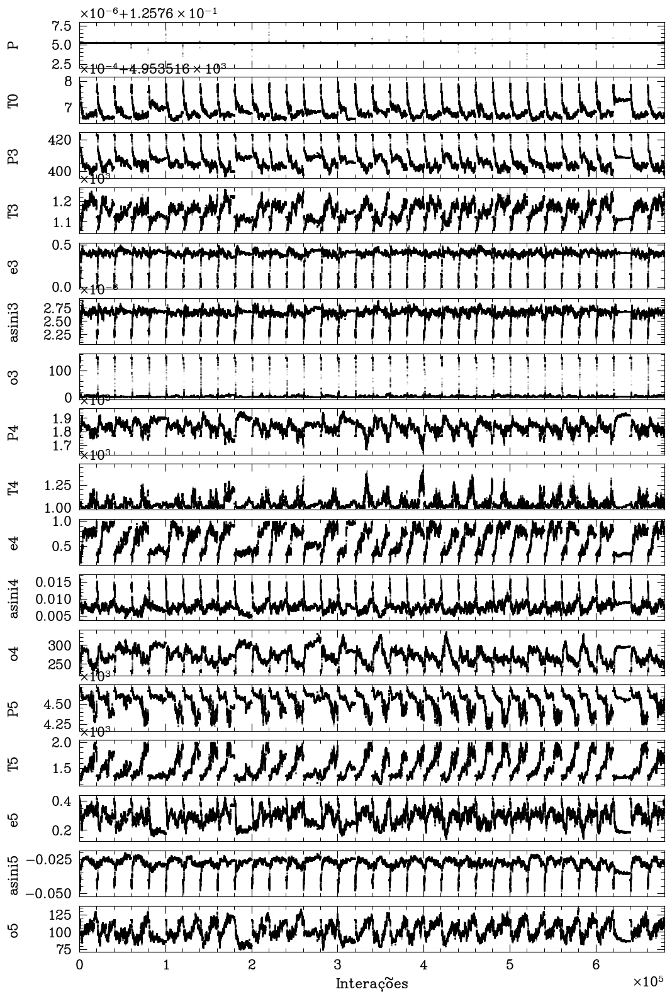

In [16]:
fig, axes = plt.subplots(ndim, figsize=(10, 16), sharex=True)
samples = sampler.chain[:, :, :].reshape((-1, ndim))
labels = ['P', 'T0', 'P3', 'T3', 'e3', 'asini3', 'o3', 'P4', 'T4', 'e4', 'asini4', 'o4', 'P5', 'T5', 'e5', 'asini5', 'o5']

for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, i,], ".k", alpha=0.1, ms=1)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)
axes[-1].set_xlabel("Interações");
#fig.savefig("aposteriori_3bodys.png")

Para sistemas com dois e três planetas, é necessário um *burn-in* de pelo menos algumas centenas:

In [17]:
flat_samples3 = sampler.get_chain(discard=2000, flat=True)

Calculando a taxa de aceitação média deste ajuste e os percentis (16%, 50% e 84%) de amostras da cadeia *MCMC* para cada parâmetro do modelo:

In [18]:
acceptance_fractions = sampler.acceptance_fraction
avg_acceptance_fraction = np.mean(acceptance_fractions)

print("Número total de propostas pós-burn-in:", len(flat_samples3))
print("Número de propostas aceitas pós-burn-in:", avg_acceptance_fraction * len(flat_samples3))
print("Taxa de aceitação média:", avg_acceptance_fraction)

Número total de propostas pós-burn-in: 612000
Número de propostas aceitas pós-burn-in: 87091.20000000001
Taxa de aceitação média: 0.1423058823529412


In [19]:
results3 = np.array([])
erroinf3 = np.array([])
errosup3 = np.array([])
for i in range(ndim):
    mcmc = np.percentile(flat_samples3[:, i], [16, 50, 84])
    q    = np.diff(mcmc)
    results3 = np.append(results3, mcmc[1])
    erroinf3 = np.append(erroinf3, q[0])
    errosup3 = np.append(errosup3, q[1])
    txt = "\mathrm{{{3}}} = {0:.4f}_{{-{1:.4f}}}^{{{2:.4f}}}"
    txt = txt.format(mcmc[1], q[0], q[1], labels[i])
    display(Math(txt))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Plotando do Diagrama Corner dos parâmetros ajustados:

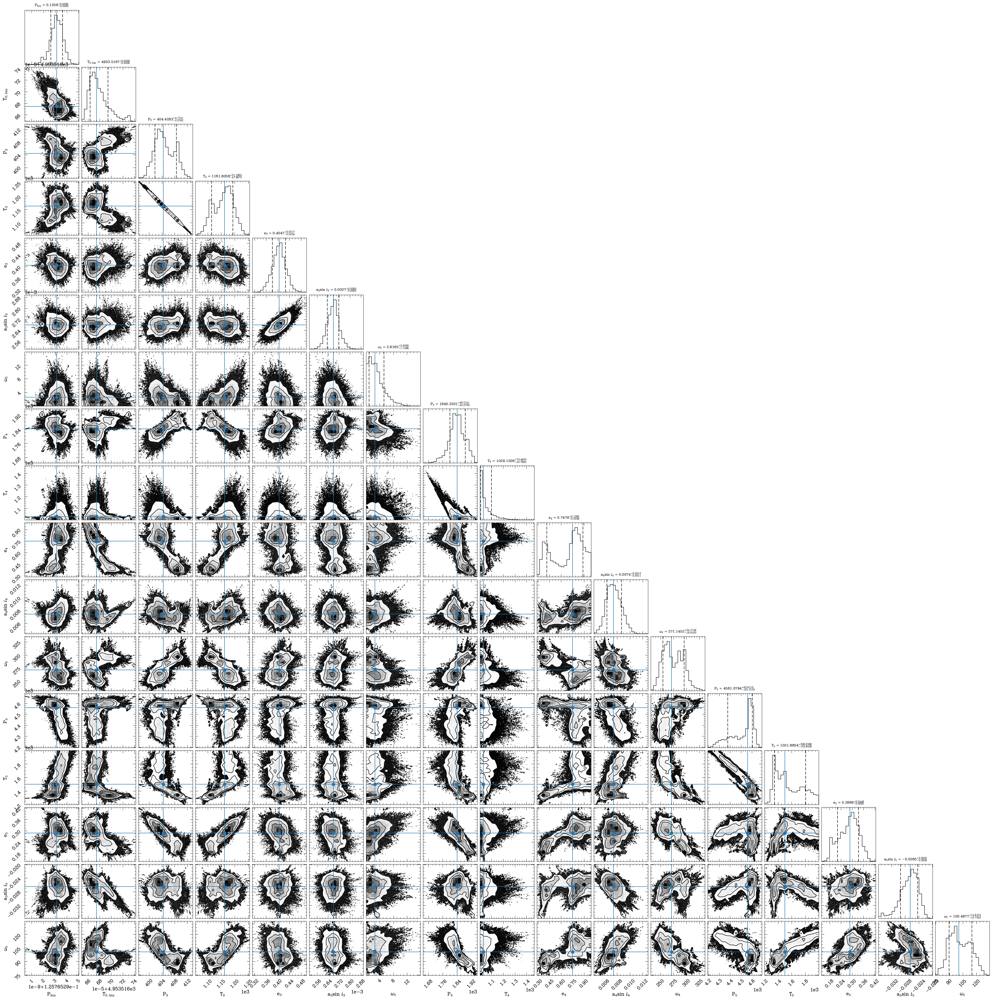

In [20]:
labels1 = [r'$\rm P_{bin}$', r'$\rm T_{0,bin}$', 
          r'$\rm P_{3}$', r'$\rm T_{3}$', r'$\mathrm{e}_{3}$', r'$\mathrm{a}_{3} \sin \, i_{3}$', r'$\omega_{3}$', 
          r'$\rm P_{4}$', r'$\rm T_{4}$', r'$\mathrm{e}_{4}$', r'$\mathrm{a}_{4} \sin \, i_{4}$', r'$\omega_{4}$',
          r'$\rm P_{5}$', r'$\rm T_{5}$', r'$\mathrm{e}_{5}$', r'$\mathrm{a}_{5} \sin \, i_{5}$', r'$\omega_{5}$']

value1 = results3
value2 = []
value3 = []


fig = corner.corner(flat_samples3, labels=labels1)


axes = np.array(fig.axes).reshape((ndim, ndim))
for i, label in enumerate(labels1):
    ax = axes[i,i]
    
    # Maximum Probability and interval
    ax.axvline(results3[i], color="tab:blue", linestyle="-")
    ax.axvline(results3[i] - erroinf3[i], color='k', ls='--')
    ax.axvline(results3[i] + errosup3[i], color='k', ls='--')
    ax.set_title(r'{0} = '.format(label)+ r'%.4f$^{+ %.4f}_{- %.4f}$'%(results3[i], errosup3[i], erroinf3[i]), fontsize=11)

    
    
for yi in range(ndim):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axvline(value1[xi], color='tab:blue', ls='-')
        ax.axhline(value1[yi], color='tab:blue', ls='-')
        ax.plot(value1[xi], value1[yi], color="tab:blue", marker='o')


#plt.savefig('model_3bodys_corner.png')

Salvando os ajustes em uma tabela e definindo a média$\pm$incerteza dos resultados:

In [21]:
tbl3 = table.Table()
tbl3['parametros'] = np.array(labels)
tbl3['valor']      = np.array(results3)
tbl3['erro_inf']   = erroinf3
tbl3['erro_sup']   = errosup3


ascii.write(tbl3, 'model_3bodys.dat', overwrite=True)
tbl3

parametros,valor,erro_inf,erro_sup
str6,float64,float64,float64
P,0.12576529314675627,5.139708381118879e-10,4.942750098102522e-10
T0,4953.516674427345,1.100505960494047e-05,1.976960356842028e-05
P3,404.4282527827842,2.576157855249278,4.174057272803111
T3,1161.8057894163928,47.68697033807098,31.196488972202815
e3,0.4046994467762455,0.023408688206484618,0.021684243758520627
asini3,0.0026797130610017126,4.4535968894259155e-05,3.929916005619358e-05
o3,2.6165300457295846,1.7495616463661117,2.6360398973919255
P4,1840.2301078910727,40.27281839087027,46.21409412863136
T4,1029.1206118367609,22.786454083534863,70.4599636970654


In [22]:
#Determinando média +/- incerteza:

data = ascii.read('model_3bodys.dat')
m = data['valor']
erro_inf = data['erro_inf']
erro_sup = data['erro_sup']

labels = ['P', 'T0', 'P3', 'T3', 'e3', 'asini3', 'o3', 'P4', 'T4', 'e4', 'asini4', 'o4', 'P5', 'T5', 'e5', 'asini5', 'o5']
print('+--------------------------------------+')
print('                 Ranges')
print('+--------------------------------------+')
for i in range(len(m)):
    m1 = m[i]
    erro = (erro_inf[i] + erro_sup[i])/2
    print(f'{labels[i]} = {m1} +/- {erro:.10e}')

+--------------------------------------+
                 Ranges
+--------------------------------------+
P = 0.12576529314675627 +/- 5.0412292396e-10
T0 = 4953.516674427345 +/- 1.5387331587e-05
P3 = 404.4282527827842 +/- 3.3751075640e+00
T3 = 1161.8057894163928 +/- 3.9441729655e+01
e3 = 0.4046994467762455 +/- 2.2546465983e-02
asini3 = 0.0026797130610017126 +/- 4.1917564475e-05
o3 = 2.6165300457295846 +/- 2.1928007719e+00
P4 = 1840.2301078910727 +/- 4.3243456260e+01
T4 = 1029.1206118367609 +/- 4.6623208890e+01
e4 = 0.7478964260997848 +/- 2.3505288290e-01
asini4 = 0.0074419391545185315 +/- 1.1554095825e-03
o4 = 271.14520460291095 +/- 2.0542419880e+01
P5 = 4561.079405816203 +/- 1.1246225015e+02
T5 = 1501.880397647547 +/- 2.3028957483e+02
e5 = 0.2888510963948201 +/- 5.5565077195e-02
asini5 = -0.02647284561588705 +/- 2.5257278739e-03
o5 = 100.4876920249208 +/- 1.2673707931e+01


Calculando o chi-quadrado reduzido, $\chi^2_{red}$, para medir a qualidade deste ajuste:

$$\chi^2_{red} = \frac{1}{N-M}\sum^{N}_{1}\left(\frac{O_j - C_j}{\sigma_j}\right)^2$$

In [23]:
# Definindo a função para calcular chi-quadrado reduzido:
def reduced_chi2_3bodys(x, y, yerr, params):
    N = len(x)
    M = len(params)
    model = model_3bodys(x, *params)
    chi2 = (1/(N-M)) * np.sum(((y - model)/yerr)**2)
    return chi2

# Calculando o chi-quadrado reduzido
params_3bodys = ascii.read('model_3bodys.dat')['valor']
print('Chi-quadrado reduzido do modelo para três PCBs: ', reduced_chi2_3bodys(x, y, yerr, params_3bodys))

Chi-quadrado reduzido do modelo para três PCBs:  11.912247718645187


Fazendo nosso plot para os resultados obtidos:

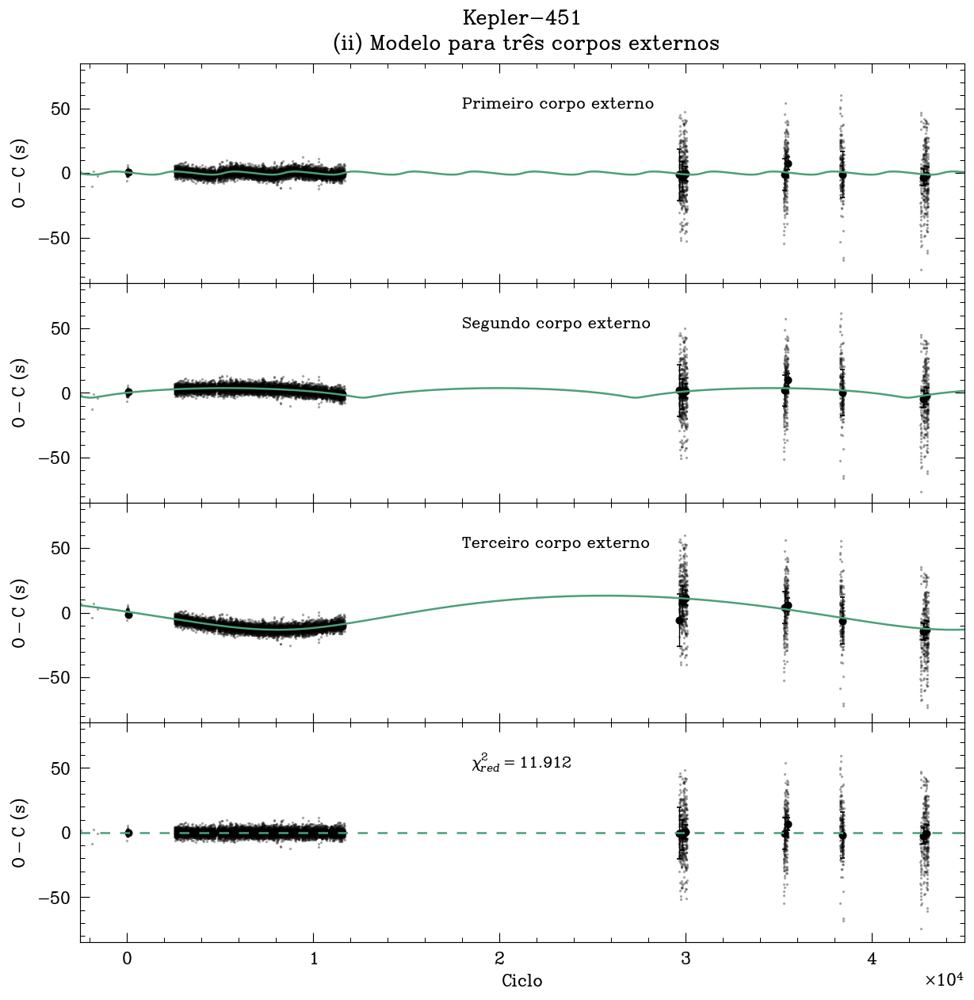

In [24]:
@jit(nopython=True)
def model_3bodys_mod (x, P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4, P5, T5, e5, asini5, o5):
    
    n_points = len(x)

    efli = np.zeros(n_points)     
    tau3 = np.zeros(n_points)
    tau4 = np.zeros(n_points)
    tau5 = np.zeros(n_points)

    r3   = 360./P3                
    r4   = 360./P4
    r5   = 360./P5

    for idx in range(n_points):
        n = x[idx]
        
        # Efeméride linear
        el = T0 + P*n
        efli[idx] = el
        
        # Primeiro corpo externo
        M  = ((T0 + P*n) - T3)*r3    
        M1 = M -(360*int(M/360.))    
        M2 = M1 * np.pi / 180.
        eps = M2 + e3*np.sin(M2)
        eps1 = eps + (M2 - (eps - e3*np.sin(eps)))/(1.0 - e3*np.cos(eps))
        for i in range(10):
            eps1 = eps1 + (M2 - (eps1 - e3*np.sin(eps1)))/(1.0 - e3*np.cos(eps1))
        q  = np.sqrt((1.0 + e3) / (1.0 - e3)) * np.tan(eps1 / 2.0)
        v  = 2. * np.arctan(q)       
        aux1  = asini3*UA / (c*24*3600)
        aux2  = ((1. - e3**2) / (1 + e3*np.cos(v))) * np.sin(v + ((o3%360)*np.pi/180.))
        aux3  = e3*np.sin((o3%360)*np.pi/180.)
        mody  = aux1 * (aux2 + aux3)
        tau3[idx] = mody
        
        # Segundo corpo externo
        M  = ((T0 + P*n) - T4)*r4    
        M1 = M -(360*int(M/360.))    
        M2 = M1 * np.pi / 180.
        eps = M2 + e4*np.sin(M2)   
        eps1 = eps + (M2 - (eps - e4*np.sin(eps)))/(1.0 - e4*np.cos(eps))
        for i in range(10):
            eps1 = eps1 + (M2 - (eps1 - e4*np.sin(eps1)))/(1.0 - e4*np.cos(eps1))
        q  = np.sqrt((1.0 + e4) / (1.0 - e4)) * np.tan(eps1 / 2.0)
        v  = 2. * np.arctan(q)       
        aux1  = asini4*UA / (c*24*3600)
        aux2  = ((1. - e4**2) / (1 + e4*np.cos(v))) * np.sin(v + ((o4%360)*np.pi/180.))
        aux3  = e4*np.sin((o4%360)*np.pi/180.)
        mody  = aux1 * (aux2 + aux3)
        tau4[idx] = mody

         # Terceiro corpo externo
        M  = ((T0 + P*n) - T5)*r5    
        M1 = M -(360*int(M/360.))    
        M2 = M1 * np.pi / 180.
        eps = M2 + e5*np.sin(M2) 
        eps1 = eps + (M2 - (eps - e5*np.sin(eps)))/(1.0 - e5*np.cos(eps))
        for i in range(10):
            eps1 = eps1 + (M2 - (eps1 - e5*np.sin(eps1)))/(1.0 - e5*np.cos(eps1))
        q  = np.sqrt((1.0 + e5) / (1.0 - e5)) * np.tan(eps1 / 2.0)
        v  = 2. * np.arctan(q)       
        aux1  = asini5*UA / (c*24*3600)
        aux2  = ((1. - e5**2) / (1 + e5*np.cos(v))) * np.sin(v + ((o5%360)*np.pi/180.))
        aux3  = e5*np.sin((o5%360)*np.pi/180.)
        mody  = aux1 * (aux2 + aux3)
        tau5[idx] = mody

    return efli, tau3, tau4, tau5


results_3bodys = ascii.read('model_3bodys.dat')['valor']
P      = results_3bodys[0]
T0     = results_3bodys[1] 
P3     = results_3bodys[2] 
T3     = results_3bodys[3] 
e3     = results_3bodys[4] 
asini3 = results_3bodys[5]
o3     = results_3bodys[6] 
P4     = results_3bodys[7] 
T4     = results_3bodys[8]
e4     = results_3bodys[9] 
asini4 = results_3bodys[10]
o4     = results_3bodys[11]
P5     = results_3bodys[12] 
T5     = results_3bodys[13]
e5     = results_3bodys[14] 
asini5 = results_3bodys[15]
o5     = results_3bodys[16]

efli, tau3, tau4, tau5 = model_3bodys_mod(x, P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4, P5, T5, e5, asini5, o5)

x0 = np.linspace(-2500, 4.5e4, 1000)
eflic, tau3c, tau4c, tau5c = model_3bodys_mod(x0, P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4, P5, T5, e5, asini5, o5)

nbin = 65
xbin1, _, yerrbin1, ybin_efli = adaptative_bin(x, y, yerr, y - tau3 - tau4 - tau5, nbin)
xbin2, _, yerrbin2, ybin_tau3 = adaptative_bin(x, y, yerr, y - efli - tau4 - tau5, nbin)
xbin3, _, yerrbin3, ybin_tau4 = adaptative_bin(x, y, yerr, y - efli - tau3 - tau5, nbin)
xbin4, _, yerrbin4, ybin_tau5 = adaptative_bin(x, y, yerr, y - efli - tau3 - tau4, nbin)
xbin5, _, yerrbin5, ybin_all  = adaptative_bin(x, y, yerr, y - efli - tau3 - tau4 - tau5, nbin)


fig = plt.figure(figsize=(12,12))
fig.subplots_adjust(hspace=0)

ax1 = plt.subplot(411)
ax1.scatter(x, (y - efli - tau4 - tau5)*24*3600, s=1, alpha=.3, c='grey')
ax1.errorbar(xbin2, (ybin_tau3)*24*3600, yerr=yerrbin2*24*3600, marker='o', ls='', capsize=2, c='k', lw=.8, ms=5, zorder=1)
ax1.plot(x0, (tau3c)*24*3600, c='#49a078', lw=1.5)
ax1.set_ylabel(r'$\rm O-C$ (s)')
ax1.set_xticklabels([])
ax1.set_xlim(-2500, 4.5e4)
ax1.set_ylim(-85, 85)
ax1.set_title('Kepler-451\n (ii) Modelo para três corpos externos')
ax1.annotate(text='Primeiro corpo externo', xy=(1.8e4, 50), fontsize=14)


ax2 = plt.subplot(412)
ax2.scatter(x, (y - efli - tau3 - tau5)*24*3600, s=1, alpha=.3, c='grey')
ax2.errorbar(xbin3, (ybin_tau4)*24*3600, yerr=yerrbin3*24*3600, marker='o', ls='', capsize=2, c='k', lw=.8, ms=5, zorder=1)
ax2.plot(x0, (tau4c)*24*3600, c='#49a078', lw=1.5)
ax2.set_ylabel(r'$\rm O-C$ (s)')
ax2.set_xticklabels([])
ax2.set_xlim(-2500, 4.5e4)
ax2.set_ylim(-85, 85)
ax2.annotate(text='Segundo corpo externo', xy=(1.8e4, 50), fontsize=14)


ax3 = plt.subplot(413)
ax3.scatter(x, (y - efli - tau3 - tau4)*24*3600, s=1, alpha=.3, c='grey')
ax3.errorbar(xbin4, (ybin_tau5)*24*3600, yerr=yerrbin4*24*3600, marker='o', ls='', capsize=2, c='k', lw=.8, ms=5, zorder=1)
ax3.plot(x0, (tau5c)*24*3600, c='#49a078', lw=1.5)
ax3.set_ylabel(r'$\rm O-C$ (s)')
ax3.set_xticklabels([])
ax3.set_xlim(-2500, 4.5e4)
ax3.set_ylim(-85, 85)
ax3.annotate(text='Terceiro corpo externo', xy=(1.8e4, 50), fontsize=14)


ax4 = plt.subplot(414)
ax4.scatter(x, (y - efli - tau3 - tau4 - tau5)*24*3600, s=1, alpha=.3, c='gray')
ax4.errorbar(xbin5, (ybin_all)*24*3600, yerr=yerrbin5*24*3600, marker='o', ls='', capsize=2, c='k', lw=.8, ms=5, zorder=1)
ax4.axhline(y=0.0, ls=(0,(5,5)),  c='#49a078', lw=1.5)
ax4.set_xlabel(r'Ciclo')
ax4.set_ylabel(r'$\rm O-C$ (s)')
ax4.set_xlim(-2500, 4.5e4)
ax4.set_ylim(-85, 85)
ax4.annotate(text=r'$\chi^{2}_{red} = $%.3f'%(reduced_chi2_3bodys(x, y, yerr, results_3bodys)), xy=(1.85e4, 50), fontsize=14)

plt.savefig('O-C_3bodys_temporario.png')

Calculando as amplitudes dos sinais senoidais $\tau_3$, $\tau_4$ e $\tau_5$:

In [25]:
amplitude_tau3 = np.max(tau3) - np.min(tau3)
amplitude_tau4 = np.max(tau4) - np.min(tau4)
amplitude_tau5 = np.max(tau5) - np.min(tau5)

print(f'Amplitude da curva tau3: {amplitude_tau3*24*3600} s')
print(f'Amplitude da curva tau4: {amplitude_tau4*24*3600} s')
print(f'Amplitude da curva tau5: {amplitude_tau5*24*3600} s')

Amplitude da curva tau3: 2.4460843967751784 s
Amplitude da curva tau4: 7.409273762294159 s
Amplitude da curva tau5: 24.502619787697647 s


### Calculando as massas dos PCBs

Partindo da Terceira Lei de Kepler e do corolário do CM, determinamos as massas mínimas dos planetas, $M_j\sin{i_j}$², pela seguinte equação:

$$\frac{4\pi^2(a_j\sin i_j)^3}{GP'^2_j} = \frac{(M_j\sin i_j)^3}
 {(M+M_j)^2} ,$$
 
onde o subscrito $j$ refere-se às perturbações causadas na binária ($CM_2$) pelo j-ésimo corpo externo ($CM_j$) de massa $M_j$. Como a massa da binária é bem maior que a do PCB, $M >> M_j$, reescrevos a equação como:

$$\frac{4\pi^2(a_j\sin i_j)^3}{GP'^2_j} = \frac{(M_j\sin i_j)^3}
 {M^2}$$
 
²Ou, considerando os PCBs coplanares à binária, $M_j\sin{i}$, onde $i$ é a inclinação da binária encontrada por [Baran et al.](https://www.aanda.org/articles/aa/abs/2015/05/aa25392-14/aa25392-14.html).

In [27]:
#Massa projetada do primeiro planeta:

P3 = 404.4282527827842
erro_P3 = (2.576157855249278+4.174057272803111)/2
asini3 = 0.0026797130610017126
erro_asini3 = (4.4535968894259155e-05+3.929916005619358e-05)/2

M3sini = ((asini3**3*(M_1+M_2)**2)/(P3/365.26)**2)**(1./3)
erro_M3sini = (((asini3+erro_asini3)**3*((M_1+erro_M1)+(M_2+erro_M2))**2)/((P3+erro_P3)/365.26)**2)**(1./3) - M3sini

#Massa projetada do segundo planeta:

P4 = 1840.2301078910727
erro_P4 = (40.27281839087027+46.21409412863136)/2
asini4 = 0.0074419391545185315
erro_asini4 = (0.0010560238204316988+0.001254795344638869)/2

M4sini = ((asini4**3*(M_1+M_2)**2)/(P4/365.26)**2)**(1./3)
erro_M4sini = (((asini4+erro_asini4)**3*((M_1+erro_M1)+(M_2+erro_M2))**2)/((P4+erro_P4)/365.26)**2)**(1./3) - M4sini

#Massa projetada do terceiro planeta:

P5 = 4561.079405816203
erro_P5 = (181.3135049124212+43.61099538234885)/2
asini5 = 0.02647284561588705
erro_asini5 = (0.0028615788487642117+0.0021898768990737255)/2

M5sini = ((asini5**3*(M_1+M_2)**2)/(P5/365.26)**2)**(1./3)
erro_M5sini = (((asini5+erro_asini5)**3*((M_1+erro_M1)+(M_2+erro_M2))**2)/((P5+erro_P5)/365.26)**2)**(1./3) - M5sini


print(f'Massa projetada do terceiro corpo: {M3sini*M_Sun/M_Jup} +/- {erro_M3sini*M_Sun/M_Jup}')
print(f'Massa projetada do quarto corpo: {M4sini*M_Sun/M_Jup} +/- {erro_M4sini*M_Sun/M_Jup}')
print(f'Massa projetada do quinto corpo: {M5sini*M_Sun/M_Jup} +/- {erro_M5sini*M_Sun/M_Jup}')

Massa projetada do terceiro corpo: 1.8664951931200475 +/- 0.10160576671450113
Massa projetada do quarto corpo: 1.887720104731081 +/- 0.3539769136781566
Massa projetada do quinto corpo: 3.666528899265726 +/- 0.45885730957677656


### Determinando o semieixo maior projetado das órbitas dos PCBs

Estimamos o semieixo maior projetado da órbita planetária a partir do $CM_2$ da binária da seguinte forma:

$$a_{M_j} = \frac{Ma_j\sin i}{M_j\sin i}$$

In [28]:
#Semi-eixo maior projetado do primeiro corpo externo:

a_M3 = asini3*(M_1+M_2)/(M3sini)
erro_aM3 = (asini3+erro_asini3)*((M_1+erro_M1)+(M_2+erro_M2))/(M3sini+erro_M3sini) - a_M3


#Semi-eixo maior projetado do segundo corpo externo:

a_M4 = asini4*(M_1+M_2)/(M4sini)
erro_aM4 = (asini4+erro_asini4)*((M_1+erro_M1)+(M_2+erro_M2))/(M4sini+erro_M4sini) - a_M4


#Semi-eixo maior projetado do terceiro corpo externo:

a_M5 = asini5*(M_1+M_2)/(M5sini)
erro_aM5 = (asini5+erro_asini5)*((M_1+erro_M1)+(M_2+erro_M2))/(M5sini+erro_M5sini) - a_M5

print(f'Semi eixo maior projetado da órbita do terceiro corpo: {a_M3} +/- {erro_aM3}')
print(f'Semi eixo maior projetado da órbita do quarto corpo: {a_M4} +/- {erro_aM4}')
print(f'Semi eixo maior projetado da órbita do quinto corpo: {a_M5} +/- {erro_aM5}')

Semi eixo maior projetado da órbita do terceiro corpo: 0.9026997698326171 +/- 0.02475437876928399
Semi eixo maior projetado da órbita do quarto corpo: 2.478736878351226 +/- 0.09342482305691702
Semi eixo maior projetado da órbita do quinto corpo: 4.5397028745067685 +/- 0.17465622328125452
